# **PakWheels Used Cars Dataset**

> ## **Problem Statement**
> The Problem Statement is that I am a car lover and I want to create an application for car lover like me, so that if anyone wan't to buy a used car they can just put some details of the car to the model and get its best price.

### About Dataset

This dataset contains information about used cars listed on `PakWheels`, a popular `online automotive marketplace in Pakistan`. The data was collected through web scraping techniques and includes key details such as `car title`, `model`, `engine type`, `transmission`, `kilometers driven`, and `price`.


### Features

- `Title`: Car listing title.
- `Model`: Car model.
- `CC`: Engine displacement in CC.
- `Engine_type`: Type of engine (e.g., Petrol, Diesel).
- `Transmission`: Transmission type (e.g., Automatic, Manual).
- `Km_Driven`: Kilometers driven by the car.
- `Prices`: Car price in Pakistani Rupees (PKR) in lakhs.

> ### Why this Dataset
> The main aim to use this dataset because `PakWheels` company has a good repetition in `Pakistan` and their car prices are quite good. That's why we are using this dataset.


### When was this Dataset Collected

This Dataset was Collected in `2024`. 

### Steps of this Project.

- In the first step we will throughly do an EDA on this Dataset to undertant it and try to get insights from it.

- In the second step we will do some Data Preprocessing and get Data ready for Modelling.

- In the third step we will train a Machine Learning Model on this Dataset to Predict the Prices of Car.

-----

## **Data Analysis and EDA**

### **Importing Libraries For Data Analysis**

In [1]:
import pandas as pd ## For Data reading and manupulation
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

### Loading the Dataset

In [3]:
df = pd.read_csv('../Data/raw.csv')
### Checking the first 5 rows of the dataset
df.head()

,Unnamed: 0,Title,Model,CC,Engine_type,Transmission,Km_Driven,prices
0,0,Honda Vezel 2019 Hybrid Z Honda Sensing for ...,2019,1500 cc,Petrol,Automatic,"26,755 km",72.50
1,1,Suzuki Wagon R 2020 Hybrid FX for Sale,2020,660 cc,Hybrid,Automatic,"9,744 km",32.50
2,2,Toyota Corolla Axio 2008 G Kurashiko for Sale,2008,1500 cc,Petrol,Automatic,"85,000 km",29.80
3,3,Toyota Corolla 2018 XLi VVTi for Sale,2018,1300 cc,Petrol,Manual,"40,000 km",33.25
4,4,Daihatsu Mira 2020 G SA III for Sale,2020,660 cc,Petrol,Automatic,"23,300 km",35.75


In [99]:
df.columns

Index(['Unnamed: 0', 'Title', 'Model', 'CC', 'Engine_type', 'Transmission',
       'Km_Driven', 'prices'],
      dtype='object')

In [4]:
### Dropping the Unnamed: 0 column
df.drop(columns='Unnamed: 0', axis=1, inplace=True)

In [101]:
### Checking the last 5 rows of the Dataset

df.tail()

,Title,Model,CC,Engine_type,Transmission,Km_Driven,prices
60550,Honda City 2022 1.5L ASPIRE CVT for Sale,2022,1500 cc,Petrol,Automatic,"1,400 km",65.0
60551,Honda City 2002 EXi S Automatic for Sale,2002,1500 cc,Petrol,Automatic,"94,000 km",10.5
60552,Suzuki Wagon R 2014 Stingray T for Sale,2014,660 cc,Petrol,Automatic,"75,000 km",23.5
60553,Daihatsu Move 2020 for Sale,2020,660 cc,Petrol,Automatic,"23,295 km",35.0
60554,Honda N Wgn 2019 for Sale,2019,660 cc,Petrol,Automatic,"38,847 km",35.5


In [102]:
### Checking the shape of the Dataset
df.shape

(60555, 7)

### **Observations**

In this dataset we have `60555` rows and `7` columns.

In [5]:
### Checking the info of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60555 entries, 0 to 60554
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Title         60555 non-null  object 
 1   Model         60555 non-null  int64  
 2   CC            60555 non-null  object 
 3   Engine_type   60555 non-null  object 
 4   Transmission  60555 non-null  object 
 5   Km_Driven     60555 non-null  object 
 6   prices        59556 non-null  float64
dtypes: float64(1), int64(1), object(5)
memory usage: 3.2+ MB


### Observations:

In this Dataset we have 5 columns in `Object` `Datatype` and 2 Columns in `Numerical` `Datatyope`

BUT:

- Model columns has to be in object Dataype.
- CC columns has to be in Integer Dataype.
- Km_Driven columns has to be in Integer Dataype.

So we have to chenge the Dataypes of these 3 columns.

In [104]:
### Checking the Nulll Values

df.isnull().sum()

Title             0
Model             0
CC                0
Engine_type       0
Transmission      0
Km_Driven         0
prices          999
dtype: int64

In [105]:
### Checking the null values data
df[df['prices'].isnull()]

,Title,Model,CC,Engine_type,Transmission,Km_Driven,prices
65,Toyota C-HR 2019 G-LED for Sale,2019,1800 cc,Hybrid,Automatic,"50,900 km",NaN
111,Mercedes Benz C Class 2018 C200 for Sale,2018,2000 cc,Petrol,Automatic,"48,200 km",NaN
132,Toyota C-HR 2019 G-LED for Sale,2019,1800 cc,Hybrid,Automatic,"50,900 km",NaN
138,Toyota Hilux 2023 Revo GR-S for Sale,2023,2800 cc,Diesel,Automatic,"6,200 km",NaN
139,Honda HR-V 2023 VTi-S for Sale,2023,1500 cc,Petrol,Automatic,"21,460 km",NaN
...,...,...,...,...,...,...,...
59502,KIA Grand Carnival 2022 Executive for Sale,2022,3500 cc,Petrol,Automatic,"14,000 km",NaN
59528,Toyota Camry 2014 Hybrid for Sale,2014,2500 cc,Hybrid,Automatic,"116,166 km",NaN
59732,Chery Tiggo 8 Pro 2023 1.6 DEX Plus for Sale,2023,1600 cc,Petrol,Automatic,"2,700 km",NaN
59974,Honda BR-V 2021 i-VTEC S for Sale,2021,1500 cc,Petrol,Automatic,"50,000 km",NaN


In [106]:
### Checking the percentage of null values 
(df.isnull().sum() / df.shape[0]) * 100

Title           0.00000
Model           0.00000
CC              0.00000
Engine_type     0.00000
Transmission    0.00000
Km_Driven       0.00000
prices          1.64974
dtype: float64

In [6]:
df_sample = df.copy()

### **EDA**

### **Univriate Analysis**

#### Checking and Analyzing the Model Column

In [108]:
### Checking and Analyzing the Model Column
df['Model'].value_counts().sort_index(ascending=False).tail(40)

Model
1995    336
1994    310
1993    282
1992    248
1991    195
1990    193
1989    168
1988    229
1987    176
1986    301
1985    122
1984    123
1983     39
1982     86
1981     29
1980     37
1979     14
1978     18
1977     13
1976     16
1975      8
1974     19
1973     11
1972      8
1971      6
1970      6
1969      2
1968      7
1967      7
1966      6
1965      4
1964      5
1963      2
1961      2
1960      6
1958      1
1952      3
1951      2
1945      1
1942      2
Name: count, dtype: int64

<Axes: xlabel='Model', ylabel='Count'>

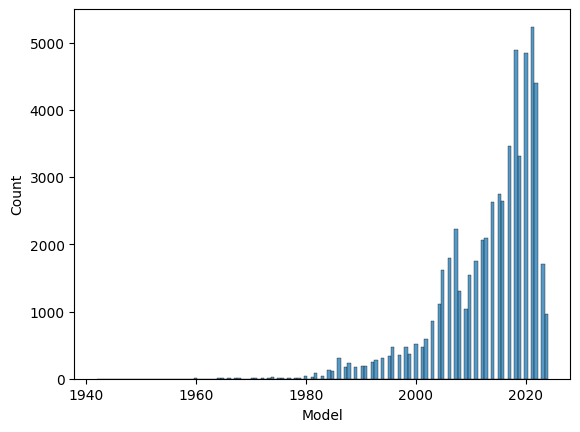

In [109]:
sns.histplot(df['Model'])

In [110]:
fig = px.histogram(df['Model'], nbins=30, title="Distribution Plot of Model year")
fig.show()

<Axes: xlabel='Model', ylabel='Density'>

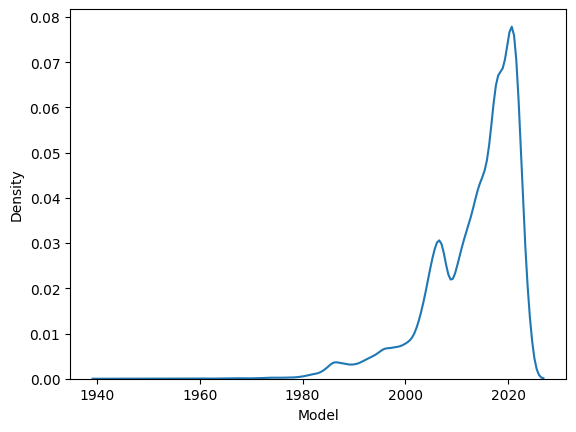

In [111]:
sns.kdeplot(df['Model'])

{'whiskers': [<matplotlib.lines.Line2D at 0x2dea6364ed0>,
 'caps': [<matplotlib.lines.Line2D at 0x2dea6366150>,
 'boxes': [<matplotlib.lines.Line2D at 0x2dea6364650>],
 'medians': [<matplotlib.lines.Line2D at 0x2dea6367010>],
 'fliers': [<matplotlib.lines.Line2D at 0x2dea6367850>],
 'means': []}

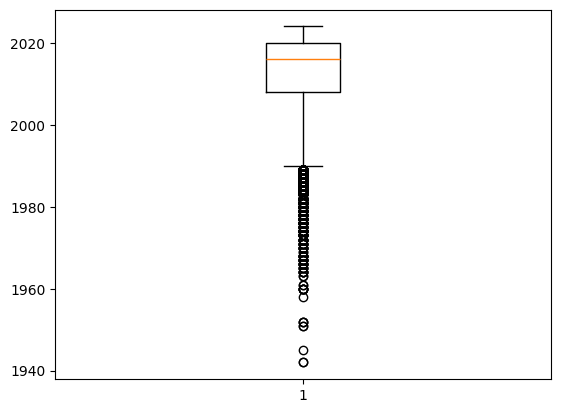

In [112]:
plt.boxplot(df['Model'])

In [113]:
df['Model'].nunique()

69

In [7]:
df_sample['Model'] = df_sample['Model'].apply(lambda x: 1980 if x < 1980 else x)

In [8]:
df_sample['Model'].value_counts()

Model
2021    5238
2018    4886
2020    4851
2022    4401
2017    3465
2019    3313
2015    2746
2016    2644
2014    2632
2007    2235
2013    2098
2012    2060
2006    1802
2011    1752
2023    1712
2005    1613
2010    1540
2008    1305
2004    1114
2009    1042
2024     964
2003     860
2002     589
2000     512
1998     476
1996     472
2001     466
1999     374
1997     350
1995     336
1994     310
1986     301
1993     282
1992     248
1988     229
1980     206
1991     195
1990     193
1987     176
1989     168
1984     123
1985     122
1982      86
1983      39
1981      29
Name: count, dtype: int64

In [9]:
df_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60555 entries, 0 to 60554
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Title         60555 non-null  object 
 1   Model         60555 non-null  int64  
 2   CC            60555 non-null  object 
 3   Engine_type   60555 non-null  object 
 4   Transmission  60555 non-null  object 
 5   Km_Driven     60555 non-null  object 
 6   prices        59556 non-null  float64
dtypes: float64(1), int64(1), object(5)
memory usage: 3.2+ MB


### Observations:

From 2000 to 2021 companies have manufectured large number of cars in this duration.

That's why the curve is shown like this.

In [86]:
df_sample.columns

Index(['Title', 'Model', 'CC', 'Engine_type', 'Transmission', 'Km_Driven',
       'prices'],
      dtype='object')

----

#### Checking `Engine_type` Column

In [91]:
df_sample['Engine_type'].value_counts()

Engine_type
Petrol      52035
Hybrid       4931
Diesel       2647
CNG           447
Electric      439
LPG            56
Name: count, dtype: int64

<Axes: xlabel='Engine_type'>

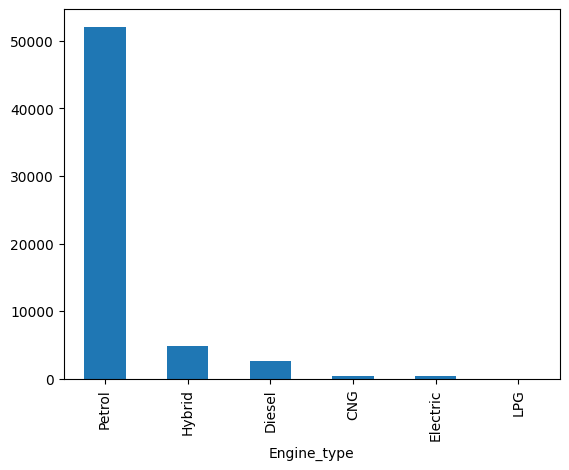

In [93]:
df_sample['Engine_type'].value_counts().plot(kind='bar')

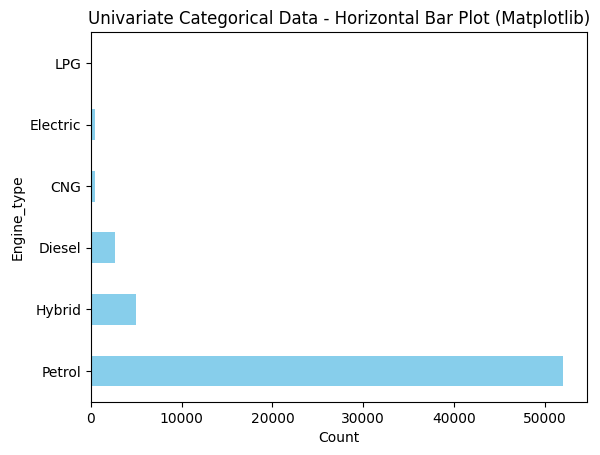

In [96]:
# 3. Horizontal Bar Plot: Use for better readability when categories have long names
df_sample['Engine_type'].value_counts().plot(kind='barh', color='skyblue')
plt.title('Univariate Categorical Data - Horizontal Bar Plot (Matplotlib)')
plt.xlabel('Count')
plt.ylabel('Engine_type')
plt.show()

### **Observations:**

In this Column we have 6 Types of Engine 
| Engine Type | Number of Counts in Dataset |
| --- | --- | 
| Petrol  |    52035|
| Hybrid  |     4931|
| Diesel  |     2647|
| CNG     |      447|
| Electric|      439|
| LPG     |       56|

----

#### Doing Some Analysis on Transmission

In [121]:
df_sample['Transmission'].value_counts()

Transmission
Automatic    38323
Manual       22232
Name: count, dtype: int64

<Axes: ylabel='count'>

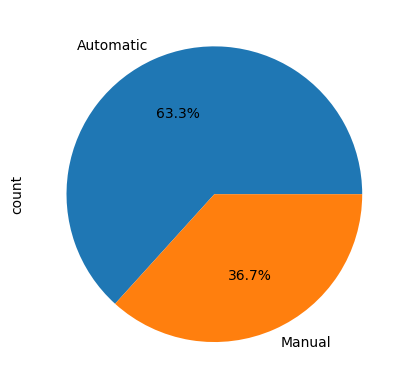

In [119]:
df_sample['Transmission'].value_counts().plot(kind='pie', autopct='%1.1f%%')

### Observations:
| Transmission | Values |
|---|---|
|Automatic|    38323|
|Manual  |     22232|

---

#### Doing Some Analysis on Km_Driven

In [122]:
df_sample.columns

Index(['Title', 'Model', 'CC', 'Engine_type', 'Transmission', 'Km_Driven',
       'prices'],
      dtype='object')

In [123]:
df_sample['Km_Driven'].unique()

array(['26,755 km', '9,744 km', '85,000 km', ..., '47,060 km',
       '139,999 km', '259,713 km'], dtype=object)

In [10]:
df_sample['Km_Driven'] = df_sample['Km_Driven'].str.replace('km', '').str.replace(',', '')

In [11]:
df_sample['Km_Driven'] = df_sample['Km_Driven'].astype('int')

In [12]:
df_sample['Km_Driven'].dtype

dtype('int64')

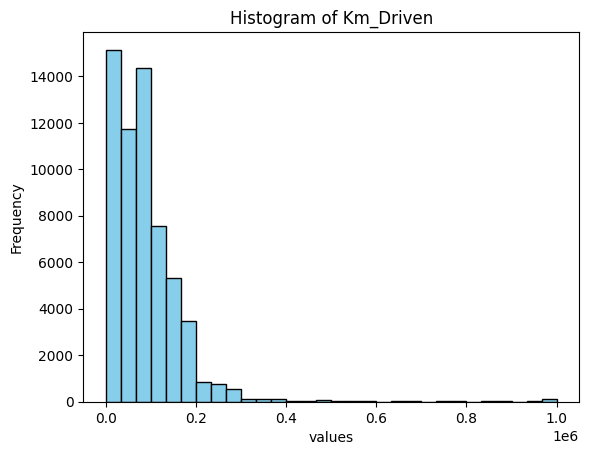

In [129]:
plt.hist(df_sample['Km_Driven'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Km_Driven')
plt.xlabel('values')
plt.ylabel('Frequency')
plt.show()

In [130]:
fig = px.box(df_sample, 'Km_Driven', title='Box Plot of Km_Driven')
fig.show()

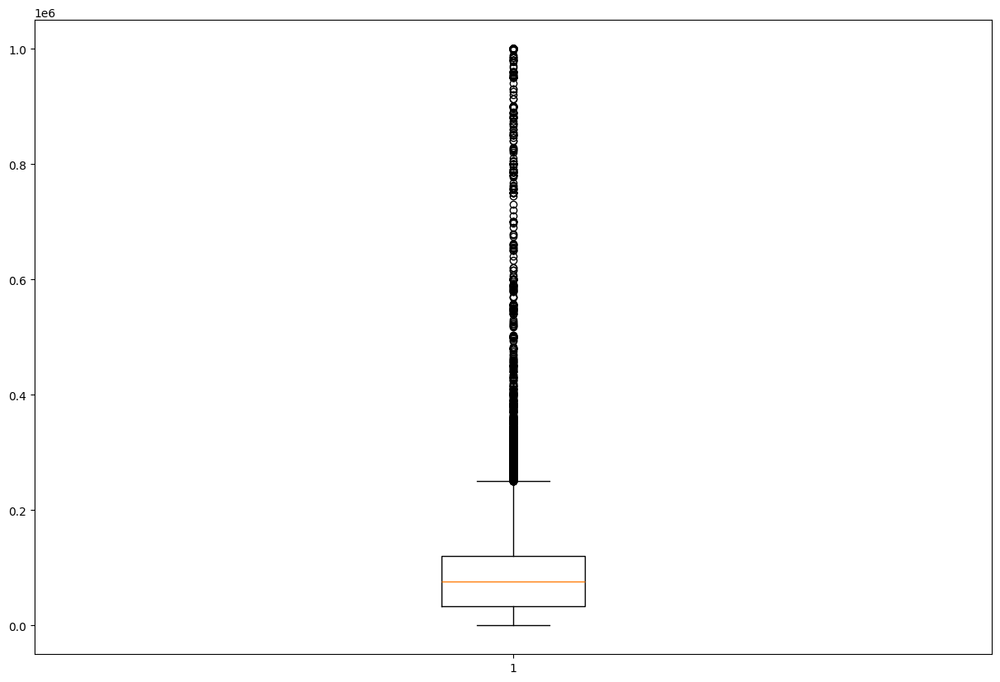

In [131]:
plt.figure(figsize=(15, 10))
plt.boxplot(df_sample['Km_Driven'])
plt.show()

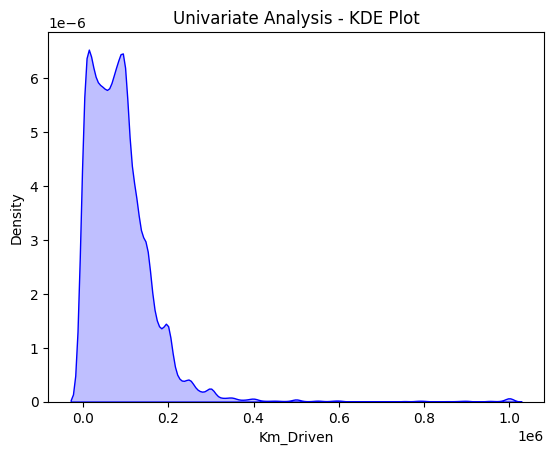

In [132]:
sns.kdeplot(df_sample['Km_Driven'], color='blue', fill=True)
plt.title('Univariate Analysis - KDE Plot')
plt.xlabel('Km_Driven')
plt.ylabel('Density')
plt.show()

### Observation:

After working with Km_Driven Column, first we have change it from categorical into numerical column.

And after that we have checked that it is not normally distributed.

----

### Analyzing CC Column

In [133]:
df_sample.columns

Index(['Title', 'Model', 'CC', 'Engine_type', 'Transmission', 'Km_Driven',
       'prices'],
      dtype='object')

In [134]:
df_sample['CC'].value_counts()

CC
1300 cc    9235
1000 cc    8770
1500 cc    8216
1800 cc    7271
660 cc     7176
           ... 
2893 cc       1
6000 cc       1
290 cc        1
8.0 kWh       1
4599 cc       1
Name: count, Length: 257, dtype: int64

In [135]:
df_sample['CC'].unique()

array(['1500 cc', '660 cc', '1300 cc', '1800 cc', '1600 cc', '1000 cc',
       '2700 cc', '659 cc', '996 cc', '2000 cc', '1198 cc', '20.0 kWh',
       '800 cc', '4600 cc', '796 cc', '3000 cc', '42.0 kWh', '1700 cc',
       '1497 cc', '1400 cc', '4200 cc', '2800 cc', '3400 cc', '4400 cc',
       '1200 cc', '2500 cc', '71.0 kWh', '2400 cc', '1598 cc', '1242 cc',
       '3500 cc', '999 cc', '1490 cc', '658 cc', '62.0 kWh', '95.0 kWh',
       '5700 cc', '1100 cc', '4000 cc', '2100 cc', '998 cc', '4700 cc',
       '41.0 kWh', '2200 cc', '100 cc', '4164 cc', '1299 cc', '4663 cc',
       '4608 cc', '64.0 kWh', '1798 cc', '3445 cc', '726.0 kWh',
       '12.0 kWh', '3496 cc', '1240 cc', '102.0 kWh', '1991 cc',
       '85.0 kWh', '997 cc', '2198 cc', '160 cc', '1496 cc', '1098 cc',
       '3378 cc', '60.0 kWh', '420.0 kWh', '2597 cc', '108.0 kWh',
       '13000 cc', '3199 cc', '55.0 kWh', '93.4 kWh', '4500 cc',
       '230.0 kWh', '600 cc', '90.0 kWh', '3982 cc', '6200 cc',
       '82.0 kWh', '7

In [13]:
df_sample['Power'] = df_sample['CC'].apply(lambda x: x.split(' ')[0])

In [14]:
df_sample['CC'].apply(lambda x: x.split(' ')[1] if len(x.split(' ')) > 1 else None)

0        cc
1        cc
2        cc
3        cc
4        cc
         ..
60550    cc
60551    cc
60552    cc
60553    cc
60554    cc
Name: CC, Length: 60555, dtype: object

In [ ]:
df_sample['CC'].apply(lambda x: x.split(' ')[0])

In [15]:
df_sample['Unit'] = df_sample['CC'].apply(lambda x: x.split(' ')[1] if len(x.split(' ')) > 1 else None)

In [155]:
df_sample

,Title,Model,Engine_type,Transmission,Km_Driven,prices,Power,Unit
0,Honda Vezel 2019 Hybrid Z Honda Sensing for ...,2019,Petrol,Automatic,26755,72.50,1500,cc
1,Suzuki Wagon R 2020 Hybrid FX for Sale,2020,Hybrid,Automatic,9744,32.50,660,cc
2,Toyota Corolla Axio 2008 G Kurashiko for Sale,2008,Petrol,Automatic,85000,29.80,1500,cc
3,Toyota Corolla 2018 XLi VVTi for Sale,2018,Petrol,Manual,40000,33.25,1300,cc
4,Daihatsu Mira 2020 G SA III for Sale,2020,Petrol,Automatic,23300,35.75,660,cc
...,...,...,...,...,...,...,...,...
60550,Honda City 2022 1.5L ASPIRE CVT for Sale,2022,Petrol,Automatic,1400,65.00,1500,cc
60551,Honda City 2002 EXi S Automatic for Sale,2002,Petrol,Automatic,94000,10.50,1500,cc
60552,Suzuki Wagon R 2014 Stingray T for Sale,2014,Petrol,Automatic,75000,23.50,660,cc
60553,Daihatsu Move 2020 for Sale,2020,Petrol,Automatic,23295,35.00,660,cc


In [16]:
df_sample['Unit'].value_counts()

Unit
cc     60048
kWh      505
Name: count, dtype: int64

In [17]:
df_sample.drop(columns='CC', axis=1, inplace=True)

### Observations:

In CC Column we have 2 different informations like the Power How much Power does the car have the its unit.

We have 2 different units 1 for eleectrical cars and other is for rest of cars.

1. Power
2. Unit

In [159]:
df_sample.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60555 entries, 0 to 60554
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Title         60555 non-null  object 
 1   Model         60555 non-null  int64  
 2   Engine_type   60555 non-null  object 
 3   Transmission  60555 non-null  object 
 4   Km_Driven     60555 non-null  int64  
 5   prices        59556 non-null  float64
 6   Power         60555 non-null  object 
 7   Unit          60553 non-null  object 
dtypes: float64(1), int64(2), object(5)
memory usage: 3.7+ MB


In [162]:
df_sample['Power'].unique()

array(['1500', '660', '1300', '1800', '1600', '1000', '2700', '659',
       '996', '2000', '1198', '20.0', '800', '4600', '796', '3000',
       '42.0', '1700', '1497', '1400', '4200', '2800', '3400', '4400',
       '1200', '2500', '71.0', '2400', '1598', '1242', '3500', '999',
       '1490', '658', '62.0', '95.0', '5700', '1100', '4000', '2100',
       '998', '4700', '41.0', '2200', '100', '4164', '1299', '4663',
       '4608', '64.0', '1798', '3445', '726.0', '12.0', '3496', '1240',
       '102.0', '1991', '85.0', '997', '2198', '160', '1496', '1098',
       '3378', '60.0', '420.0', '2597', '108.0', '13000', '3199', '55.0',
       '93.4', '4500', '230.0', '600', '90.0', '3982', '6200', '82.0',
       '75.0', '880', '1498', '105.0', '1997', '1197', '200', '2600',
       '2300', '120.0', '1900', '66.0', '6300', '3600', '3300', '2497',
       '40.0', '600.0', '1200.0', '4999', '750.0', '5500', '3470', '2755',
       '657', '4300', '521.0', '6601', '3200', '555', '93.0', '51.0',
       '4

In [18]:
df_sample[df_sample['Power'] == 'cc']

,Title,Model,Engine_type,Transmission,Km_Driven,prices,Power,Unit
12665,Toyota Passo 2021 X S for Sale,2021,Petrol,Automatic,81787,42.5,cc,None
59174,Toyota Vitz 2014 F 1.0 for Sale,2014,Petrol,Automatic,150000,32.0,cc,None


In [19]:
df_sample.drop([12665, 59174], axis=0, inplace=True)

In [20]:
df_sample['Power'] = df_sample['Power'].astype('float')

---

## Bivariate Analysis

In [156]:
df_sample.columns

Index(['Title', 'Model', 'Engine_type', 'Transmission', 'Km_Driven', 'prices',
       'Power', 'Unit'],
      dtype='object')

In [21]:
numerical_cols = [col for col in df_sample.columns if df_sample[col].dtype == 'int' or df_sample[col].dtype == 'float']

In [167]:
numerical_cols

['Model', 'Km_Driven', 'prices', 'Power']

In [22]:
categorical_cols = [col for col in df_sample.columns if df_sample[col].dtype == 'object']

In [169]:
categorical_cols

['Title', 'Engine_type', 'Transmission', 'Unit']

In [170]:
fig = px.scatter(df_sample, x='prices', y='Km_Driven', title='Bivariate Analysis - Scatter Plot')
fig.show()

In [174]:
fig = px.scatter(df_sample, x='Model', y='prices', title='Bivariate Analysis - Scatter Plot')
fig.show()

In [175]:
fig = px.scatter(df_sample, x='prices', y='Power', title='Bivariate Analysis - Scatter Plot')
fig.show()

In [177]:
fig = px.scatter(df_sample, x='Model', y='Power', title='Bivariate Analysis - Scatter Plot')
fig.show()

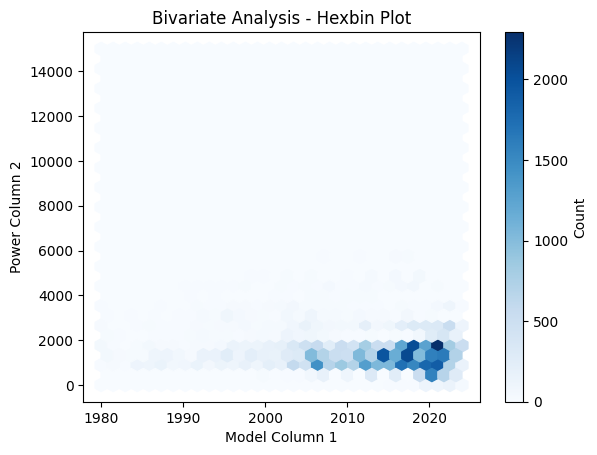

In [179]:
plt.hexbin(df_sample['Model'], df_sample['Power'], gridsize=30, cmap='Blues')
plt.colorbar(label='Count')
plt.title('Bivariate Analysis - Hexbin Plot')
plt.xlabel('Model Column 1')
plt.ylabel('Power Column 2')
plt.show()

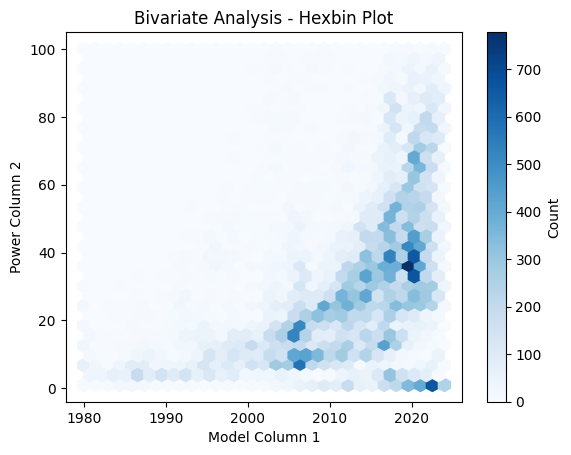

In [ ]:
plt.hexbin(df_sample['Model'], df_sample['prices'], gridsize=30, cmap='Blues')
plt.colorbar(label='Count')
plt.title('Bivariate Analysis - Hexbin Plot')
plt.xlabel('Model Column 1')
plt.ylabel('prices Column 2')
plt.show()

In [182]:
categorical_cols

['Title', 'Engine_type', 'Transmission', 'Unit']

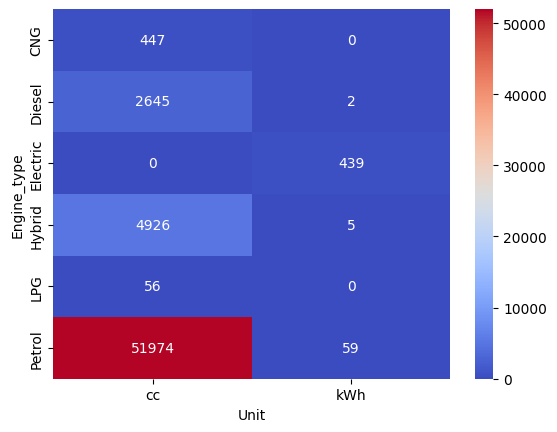

In [184]:
crosstab = pd.crosstab(df_sample['Engine_type'], df_sample['Unit'])

sns.heatmap(crosstab, annot=True, cmap='coolwarm', fmt='d')
plt.show()

---

In [188]:
df_sample['Title']

0        Honda Vezel  2019 Hybrid Z Honda Sensing  for ...
1                  Suzuki Wagon R  2020 Hybrid FX for Sale
2           Toyota Corolla Axio  2008 G Kurashiko for Sale
3                   Toyota Corolla  2018 XLi VVTi for Sale
4                    Daihatsu Mira  2020 G SA III for Sale
                               ...                        
60550            Honda City  2022 1.5L ASPIRE CVT for Sale
60551            Honda City  2002 EXi S Automatic for Sale
60552             Suzuki Wagon R  2014 Stingray T for Sale
60553                        Daihatsu Move  2020  for Sale
60554                          Honda N Wgn  2019  for Sale
Name: Title, Length: 60553, dtype: object

In [23]:
df_sample['Company'] = df_sample['Title'].apply(lambda x: x.split(' ')[0])

In [24]:
df_sample

,Title,Model,Engine_type,Transmission,Km_Driven,prices,Power,Unit,Company
0,Honda Vezel 2019 Hybrid Z Honda Sensing for ...,2019,Petrol,Automatic,26755,72.50,1500.0,cc,Honda
1,Suzuki Wagon R 2020 Hybrid FX for Sale,2020,Hybrid,Automatic,9744,32.50,660.0,cc,Suzuki
2,Toyota Corolla Axio 2008 G Kurashiko for Sale,2008,Petrol,Automatic,85000,29.80,1500.0,cc,Toyota
3,Toyota Corolla 2018 XLi VVTi for Sale,2018,Petrol,Manual,40000,33.25,1300.0,cc,Toyota
4,Daihatsu Mira 2020 G SA III for Sale,2020,Petrol,Automatic,23300,35.75,660.0,cc,Daihatsu
...,...,...,...,...,...,...,...,...,...
60550,Honda City 2022 1.5L ASPIRE CVT for Sale,2022,Petrol,Automatic,1400,65.00,1500.0,cc,Honda
60551,Honda City 2002 EXi S Automatic for Sale,2002,Petrol,Automatic,94000,10.50,1500.0,cc,Honda
60552,Suzuki Wagon R 2014 Stingray T for Sale,2014,Petrol,Automatic,75000,23.50,660.0,cc,Suzuki
60553,Daihatsu Move 2020 for Sale,2020,Petrol,Automatic,23295,35.00,660.0,cc,Daihatsu


In [26]:
df_sample['Title'].apply(lambda x: x.split(' ')[1:3]).apply(lambda x: ' '.join(x))

0              Vezel 
1             Wagon R
2        Corolla Axio
3            Corolla 
4               Mira 
             ...     
60550           City 
60551           City 
60552         Wagon R
60553           Move 
60554           N Wgn
Name: Title, Length: 60553, dtype: object

In [27]:
df_sample['Model_name'] = df_sample['Title'].apply(lambda x: x.split(' ')[1:3]).apply(lambda x: ' '.join(x))

In [28]:
df_sample['Model_name'].isnull().sum()

np.int64(0)

In [30]:
df_sample['Model_name'].nunique()

518

In [32]:
df_sample.drop(columns='Title', axis=1, inplace=True)

In [33]:
df_sample

,Model,Engine_type,Transmission,Km_Driven,prices,Power,Unit,Company,Model_name
0,2019,Petrol,Automatic,26755,72.50,1500.0,cc,Honda,Vezel
1,2020,Hybrid,Automatic,9744,32.50,660.0,cc,Suzuki,Wagon R
2,2008,Petrol,Automatic,85000,29.80,1500.0,cc,Toyota,Corolla Axio
3,2018,Petrol,Manual,40000,33.25,1300.0,cc,Toyota,Corolla
4,2020,Petrol,Automatic,23300,35.75,660.0,cc,Daihatsu,Mira
...,...,...,...,...,...,...,...,...,...
60550,2022,Petrol,Automatic,1400,65.00,1500.0,cc,Honda,City
60551,2002,Petrol,Automatic,94000,10.50,1500.0,cc,Honda,City
60552,2014,Petrol,Automatic,75000,23.50,660.0,cc,Suzuki,Wagon R
60553,2020,Petrol,Automatic,23295,35.00,660.0,cc,Daihatsu,Move


In [34]:
df_sample.to_csv('../Data/preprocessing.csv')